# CIS5450 Final Project

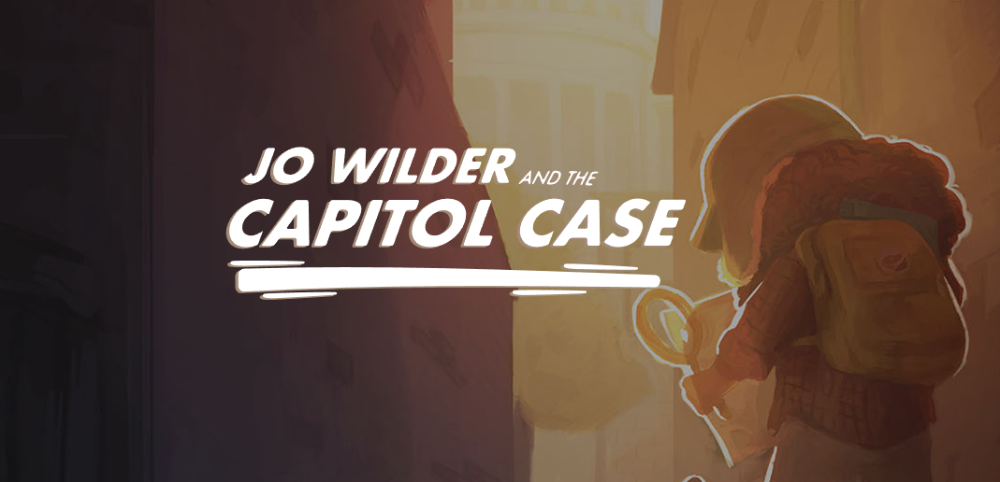

## Project Overview

This CIS 5450 Final Project is based on the current Kaggle competition, [Predict Student Performance from Game Play](https://www.kaggle.com/competitions/predict-student-performance-from-game-play/overview). The Jo Wilder online educational game is a video game that challenges students to solve a set of mysteries. As they progress through the game, players are asked 18 questions across 22 levels, and must answer the questions correctly in order to move on and eventually beat the game. The objective of this CIS 5450 Final Project is to trace student learning from their performance in the game, using one of the largest open datasets of game logs.

Game-based learning is a growing trend in education, as it allows students to engage with educational content in an enjoyable and dynamic way. However, there are still a limited number of open datasets available for data science and learning analytics researchers to apply their principles to game-based learning. The competition aims to advance research into knowledge-tracing methods for game-based learning and support developers of educational games to create more effective learning experiences for students.

While knowledge tracing methods have been developed and studied in the context of online learning environments and intelligent tutoring systems, there has been less focus on knowledge tracing in educational games. The competition host, Field Day Lab, is a publicly-funded research lab at the Wisconsin Center for Educational Research. They design games for many subjects and age groups that bring contemporary research to the public, making use of the game data to understand how people learn. The lab's commitment to accessibility ensures all of its games are free and available to anyone, and they also partner with non-profits like The Learning Agency Lab, which is focused on developing science of learning-based tools and programs for the social good.

### Problem Statement

We are looking to develop models on a large open dataset of game logs. Specifically, we want to predict the perofrmance of a player on a specific question given their performance on previous questions/parts of the game. This adds a layer of complexity because for more advanced models we are essentially looking to factor in previous predictions into the present state of any model.  

### Data Summary

#### Data File
- train.csv - the training set that we will use for both training models and validating models (train test split)

#### Features
- session_id - the ID of the session the event took place in
- index - the index of the event for the session
- elapsed_time - how much time has passed (in milliseconds) between the start of the session and when the event was recorded
- event_name - the name of the event type
- name - the event name (e.g. identifies whether a notebook_click is is opening or closing the notebook)
- level - what level of the game the event occurred in (0 to 22)
- page - the page number of the event (only for notebook-related events)
- room_coor_x - the coordinates of the click in reference to the in-game room (only for click events)
- room_coor_y - the coordinates of the click in reference to the in-game room (only for click events)
- screen_coor_x - the coordinates of the click in reference to the player’s screen (only for click events)
- screen_coor_y - the coordinates of the click in reference to the player’s screen (only for click events)
- hover_duration - how long (in milliseconds) the hover happened for (only for hover events)
- text - the text the player sees during this event
- fqid - the fully qualified ID of the event
- room_fqid - the fully qualified ID of the room the event took place in
- text_fqid - the fully qualified ID of the
- fullscreen - whether the player is in fullscreen mode
- hq - whether the game is in high-quality
- music - whether the game music is on or off
- level_group - which group of levels - and group of questions - this row belongs to (0-4, 5-12, 13-22)


# Analysis

## Data Upload and Package Imports

Package Import: Here we import packages used for data cleaning, data wrangling, exploratory data analysis, visualizations, and modeling. 

In [3]:
import pandas as pd
import numpy as np
import xgboost as xgb
import json

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold, GroupKFold, GridSearchCV, train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score

Data Upload: We upload the training data here. We will use this data for initial exploratory analysis and training our models. We also take a first look at the data to get a sense of the features and values present.

In [6]:
train = pd.read_csv('kagglegameplaydata/train.csv')

FileNotFoundError: [Errno 2] No such file or directory: 'kagglegameplaydata/train.csv'

In [8]:
train.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,level_group
0,20090312431273200,0,0,cutscene_click,basic,0,NaN,-413.991405,-159.314686,380.0,494.0,NaN,undefined,intro,tunic.historicalsociety.closet,tunic.historicalsociety.closet.intro,0,0,1,0-4
1,20090312431273200,1,1323,person_click,basic,0,NaN,-413.991405,-159.314686,380.0,494.0,NaN,"Whatcha doing over there, Jo?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4
2,20090312431273200,2,831,person_click,basic,0,NaN,-413.991405,-159.314686,380.0,494.0,NaN,Just talking to Teddy.,gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4
3,20090312431273200,3,1147,person_click,basic,0,NaN,-413.991405,-159.314686,380.0,494.0,NaN,I gotta run to my meeting!,gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4
4,20090312431273200,4,1863,person_click,basic,0,NaN,-412.991405,-159.314686,381.0,494.0,NaN,"Can I come, Gramps?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4


## Getting Familiar with the Data

We first check if there are null values that exist in our data set. We see that there are, but we realize that these null values do not need to be removed as they often indicate a lack of a game element (e.g. no text, no object being hovered), rather than an actual error in the data collection process.

In [9]:
train.isna().sum()

session_id               0
index                    0
elapsed_time             0
event_name               0
name                     0
level                    0
page              25732402
room_coor_x        2073272
room_coor_y        2073272
screen_coor_x      2073272
screen_coor_y      2073272
hover_duration    24294702
text              16679807
fqid               8274415
room_fqid                0
text_fqid         16679702
fullscreen               0
hq                       0
music                    0
level_group              0
dtype: int64

Here we take a look at the features and their respective types. We will need to have a good understanding of which features are numerical or categorical before we can generate visualizations and train models.

In [10]:
train.dtypes

session_id          int64
index               int64
elapsed_time        int64
event_name         object
name               object
level               int64
page              float64
room_coor_x       float64
room_coor_y       float64
screen_coor_x     float64
screen_coor_y     float64
hover_duration    float64
text               object
fqid               object
room_fqid          object
text_fqid          object
fullscreen          int64
hq                  int64
music               int64
level_group        object
dtype: object

Summary statistics of the the numerical features within the data. For example, we see that the average hover duration on any object is 3.471003e+03	milliseconds. Some of these statistics are irrelevant (e.g. the mean of the session_id has no clear significance in our analysis).

In [11]:
train.describe()

,session_id,index,elapsed_time,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,fullscreen,hq,music
count,2.629695e+07,2.629695e+07,2.629695e+07,2.629695e+07,564544.000000,2.422367e+07,2.422367e+07,2.422367e+07,2.422367e+07,2.002244e+06,2.629695e+07,2.629695e+07,2.629695e+07
mean,2.113249e+16,6.445102e+02,4.016694e+06,1.219169e+01,3.166559,-5.490579e+01,-1.162119e+02,4.584098e+02,3.855860e+02,3.471003e+03,1.370037e-01,1.202047e-01,9.293778e-01
std,5.712953e+14,5.457880e+02,3.127032e+07,6.497789e+00,2.063291,5.202926e+02,2.184710e+02,2.479389e+02,1.298166e+02,4.602024e+05,3.438513e-01,3.252008e-01,2.561926e-01
min,2.009031e+16,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,-1.992355e+03,-9.181623e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.101022e+16,2.880000e+02,4.397000e+05,6.000000e+00,1.000000,-3.528395e+02,-2.127183e+02,2.690000e+02,3.040000e+02,9.900000e+01,0.000000e+00,0.000000e+00,1.000000e+00
50%,2.104021e+16,5.950000e+02,1.014801e+06,1.300000e+01,3.000000,-1.116280e+01,-9.760534e+01,4.470000e+02,3.970000e+02,4.190000e+02,0.000000e+00,0.000000e+00,1.000000e+00
75%,2.110052e+16,8.960000e+02,1.747040e+06,1.800000e+01,5.000000,2.966515e+02,2.268786e+01,6.630000e+02,4.710000e+02,1.266000e+03,0.000000e+00,0.000000e+00,1.000000e+00
max,2.210022e+16,2.047300e+04,1.988607e+09,2.200000e+01,6.000000,1.261774e+03,5.436164e+02,1.919000e+03,1.440000e+03,2.451637e+08,1.000000e+00,1.000000e+00,1.000000e+00


## Exploratory Data Analysis, Data Processing, and Wrangling

In this section, we generate some intial visualizations to get a better understanding of the distributions and characteristics of specific features present in the data.

### Distribution of User Generated Events

User generated events such as navigation clicks, cutscene clicks, and hovering are relevant to our analysis. Which user generated event is the most common? Which is the most uncommon? We generate a histogram to check out the distribution of user generated events below.

We see that navigation clicks are the most common, followed by clicks on people (for dialogue), and clicks to go through cutscenes.

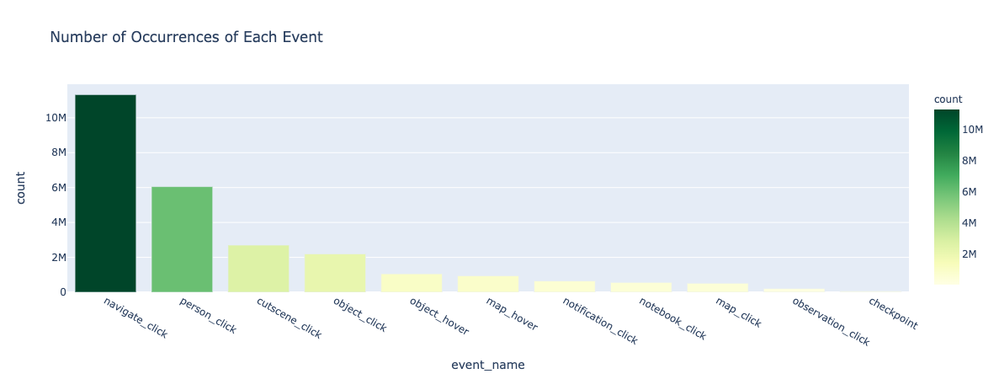

In [46]:
events = train['event_name'].value_counts().reset_index()
events.columns = ['event_name', 'count']

fig = px.bar(events, 
             x='event_name', 
             y='count', 
             color_continuous_scale='YlGn',
             color='count', 
             title="Number of Occurrences of Each Event")

fig.show()

### Distribution of total number of events

We are also interested in the total number of events within each session_id. We visualize this distribution here. We see that the most common value of total events was around 1000 (the distribution looks approximately normal with a right tail).

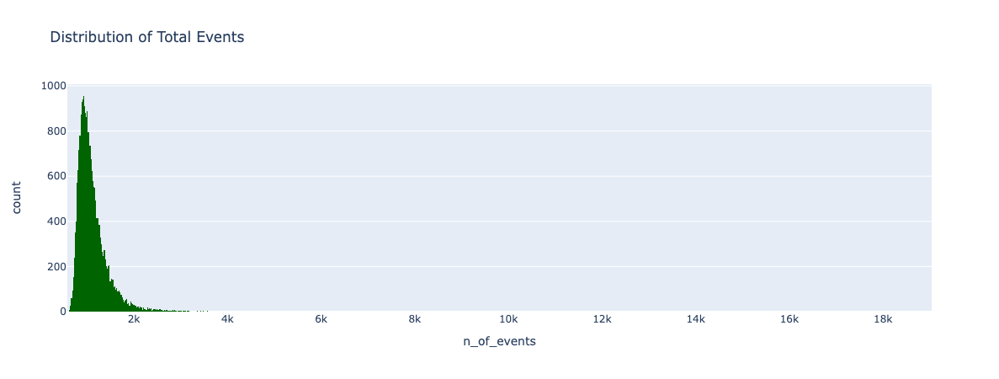

In [38]:
num_events = pd.DataFrame(train.groupby('session_id').size())
num_events.columns = ["n_of_events"]

fig = px.histogram(num_events, x="n_of_events", title="Distribution of Total Events", color_discrete_sequence=['darkgreen'])
fig.show()

### Winsorizing Data on Number of Events

We see that the vast majority of events have a number of actions lower than around 2500. Session ids with a outlying amount of events (e.g. over 18,000) are suspicious. We choose to remove such data points intead of winsorizing as we believe that the extreme values are clearly outliers that are not representative of the underlying population, and influence on analysis is more likely to be misleading.

In [42]:
num_events = num_events.reset_index()
bad_sessions = num_events[num_events['n_of_events'] > 2500]

print("Percentage of sessions with more than 2500 events:", len(bad_sessions) / len(num_events))

p99 = num_events['n_of_events'].quantile(0.99)
bad_sessions = num_events[num_events['n_of_events'] > p99]

bad_session_list = bad_sessions['session_id'].unique()
print("Number of sessions in the top percentile by event count:", len(bad_session_list))

train_cleaned = train.loc[~train["session_id"].isin(bad_session_list)]
print("Number of rows in original train data set:", len(train))
print("Number of rows in new train data set:", len(train_cleaned))
rows_removed = len(train) - len(train_cleaned)
print("Number of rows removed:", rows_removed)

Percentage of sessions with more than 2500 events: 0.007724301841948901

Number of sessions in the top percentile by event count: 236

Number of rows in original train data set: 26296946

Number of rows in new train data set: 25613663

Number of rows removed: 683283


### Average Time Spent on Each Level

We are also interested in finding out how long on average people spend on each question. This may be an indication of which questions are the hardest, as we would assume more difficult questions require more time to solve. We see that levels 1, 12, 14, and 22 see the shortest elapsed time, whereas levels 6, 13, 18, 21 have the greatest elapsed time. 

In [44]:
filtered = train[['session_id', 'index', 'elapsed_time', 'level']]

sorted_df = filtered.sort_values(['session_id', 'index', 'level'])

session_times = sorted_df.groupby('session_id')['elapsed_time'].max()

sorted_df['level_time'] = sorted_df.groupby('session_id')['elapsed_time'].diff()

level_means = sorted_df.groupby('level')['level_time'].mean()

session_times = sorted_df.groupby(["session_id", "level"])["elapsed_time"].max().reset_index()
session_times["level_time"] = session_times.groupby("session_id")['elapsed_time'].diff()
session_times["level_time"] = session_times["level_time"].fillna(session_times["elapsed_time"])

session_times

,session_id,level,elapsed_time,level_time
0,20090312431273200,0,25766,25766.0
1,20090312431273200,1,65459,39693.0
2,20090312431273200,2,100713,35254.0
3,20090312431273200,3,155754,55041.0
4,20090312431273200,4,194860,39106.0
...,...,...,...,...
541337,22100221145014656,18,5071132,364607.0
541338,22100221145014656,19,5151073,79941.0
541339,22100221145014656,20,5207469,56396.0
541340,22100221145014656,21,5469305,261836.0


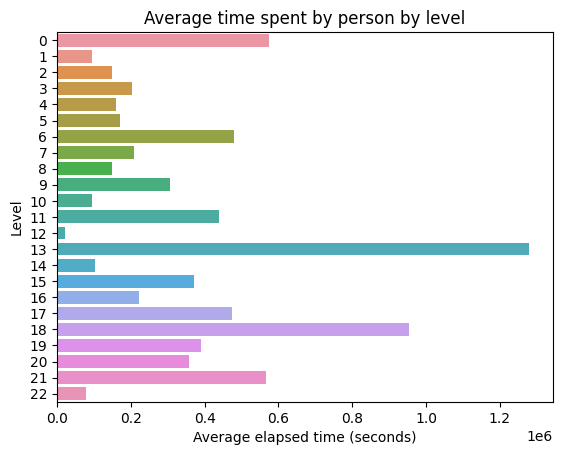

<Figure size 1200x800 with 0 Axes>

In [45]:
ax = sns.barplot(data=session_times.groupby("level")["level_time"].mean().reset_index(), x="level_time", y="level", orient="h")

ax.set_xlabel('Average elapsed time (seconds)')
ax.set_ylabel('Level')
ax.set_title('Average time spent by person by level')

plt.figure(figsize=(12, 8))
plt.show()

### Click Distribution Across Rooms

Out of curiosity, we note that many rows contain x and y coordinates for mouse click events. It would be interesting to visualize a heatmap of these clicks to see where on each level users click the most frequently. We see that clicks are concentrated around objects in rooms, and we are able to get a sense of where the user's playable character moved the most on each of the 19 potential screens of the game.

Note that there are some noticeably dark rectangles on the screen--this is because these are not classified as "navigate clicks" (clicks with the purpose of just navigating around the room)

In [21]:
rooms = train.room_fqid.unique()
print('# of rooms:', len(rooms) )
print(rooms)

# of rooms: 19

['tunic.historicalsociety.closet' 'tunic.historicalsociety.basement'

 'tunic.historicalsociety.entry' 'tunic.historicalsociety.collection'

 'tunic.historicalsociety.stacks' 'tunic.kohlcenter.halloffame'

 'tunic.capitol_0.hall' 'tunic.historicalsociety.closet_dirty'

 'tunic.historicalsociety.frontdesk' 'tunic.humanecology.frontdesk'

 'tunic.drycleaner.frontdesk' 'tunic.library.frontdesk'

 'tunic.library.microfiche' 'tunic.capitol_1.hall'

 'tunic.historicalsociety.cage' 'tunic.historicalsociety.collection_flag'

 'tunic.wildlife.center' 'tunic.flaghouse.entry' 'tunic.capitol_2.hall']


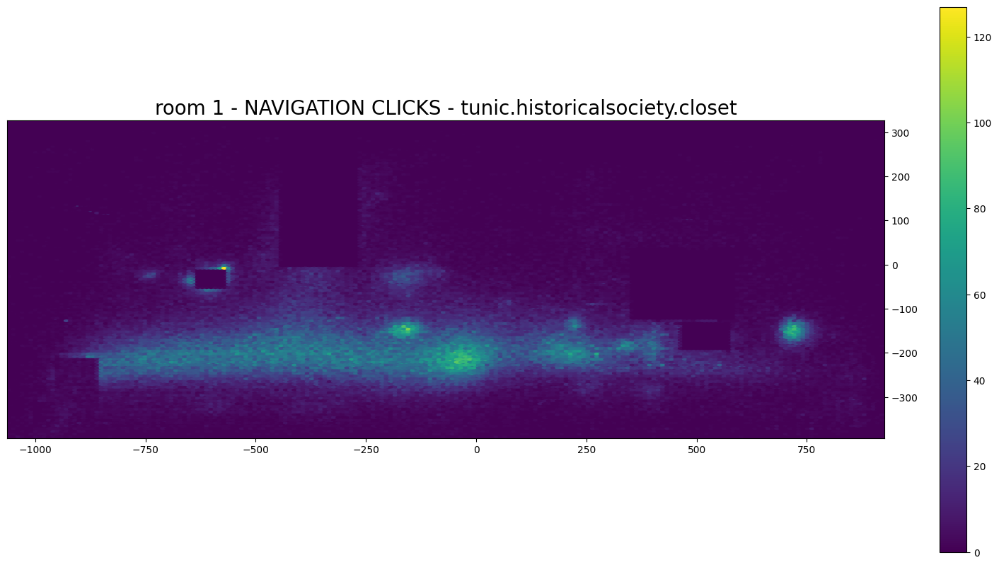

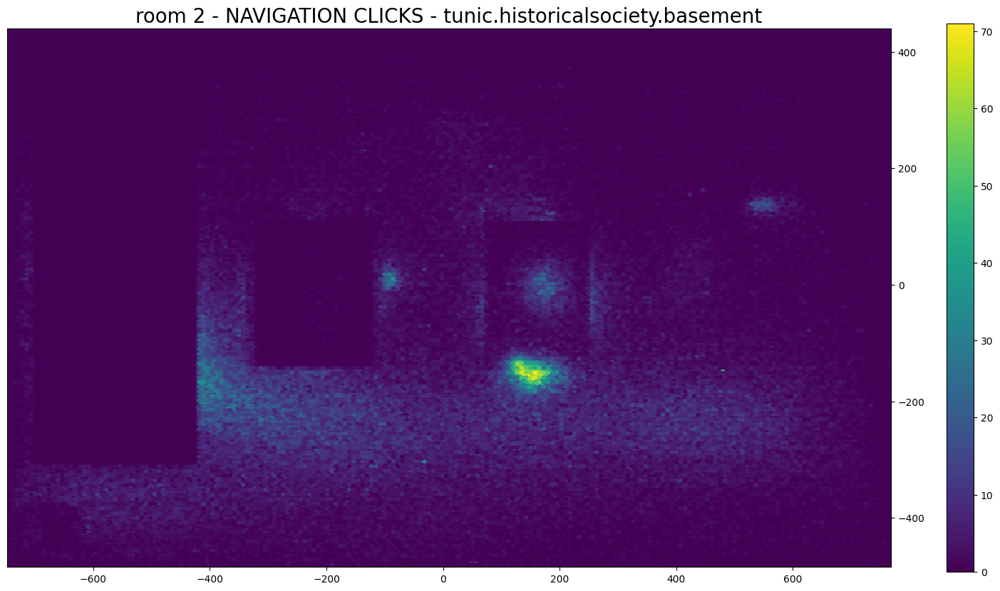

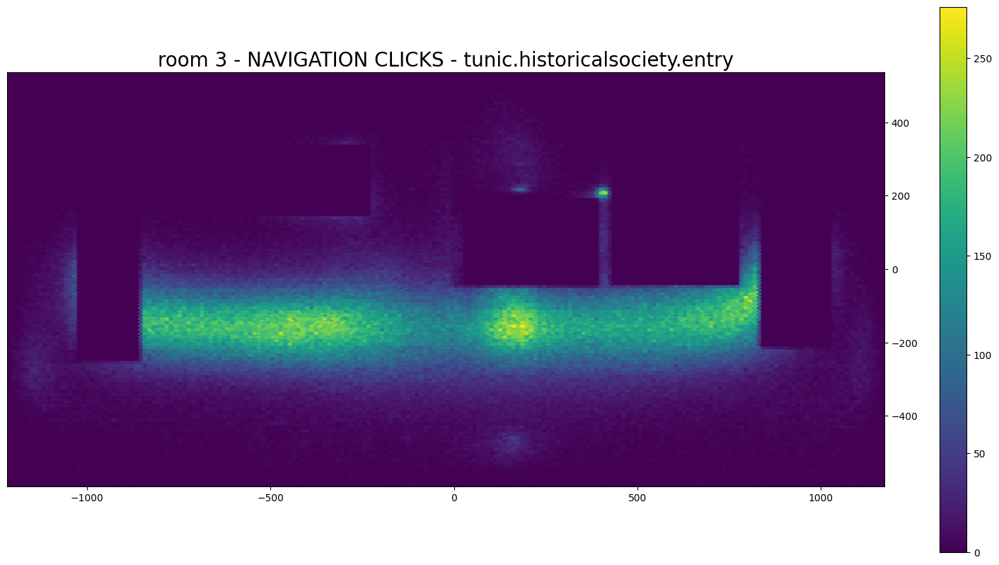

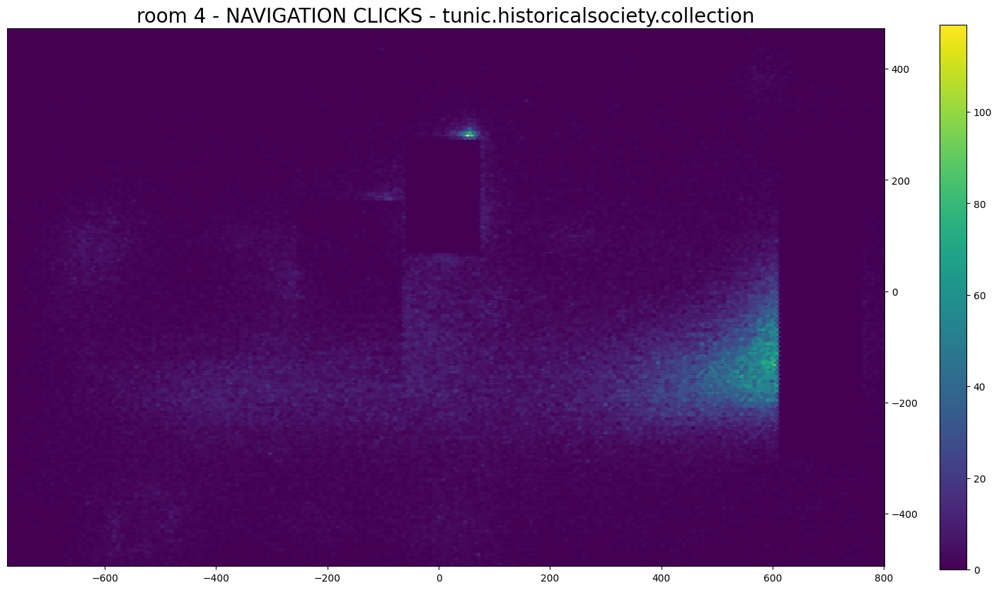

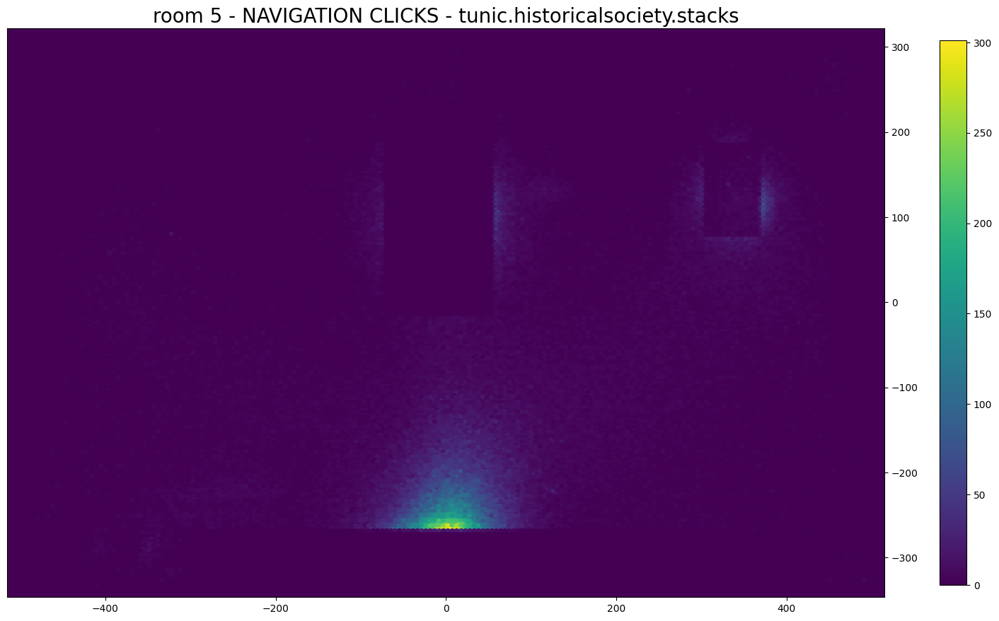

...

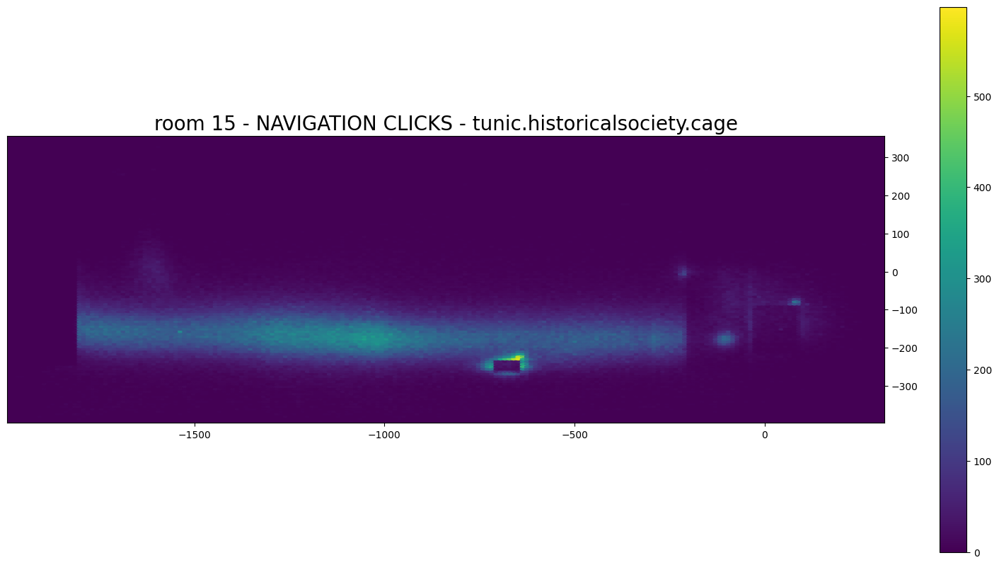

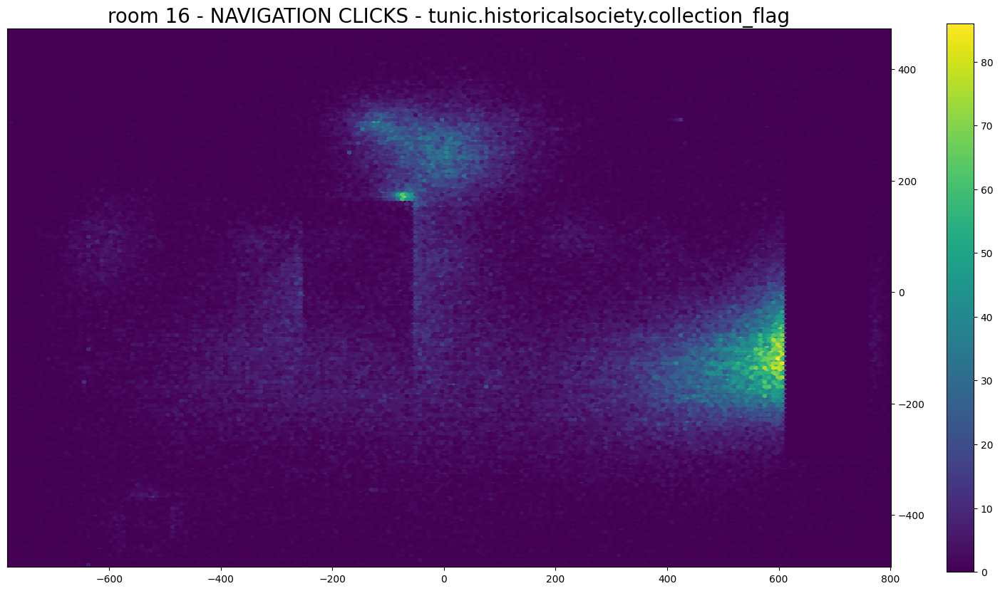

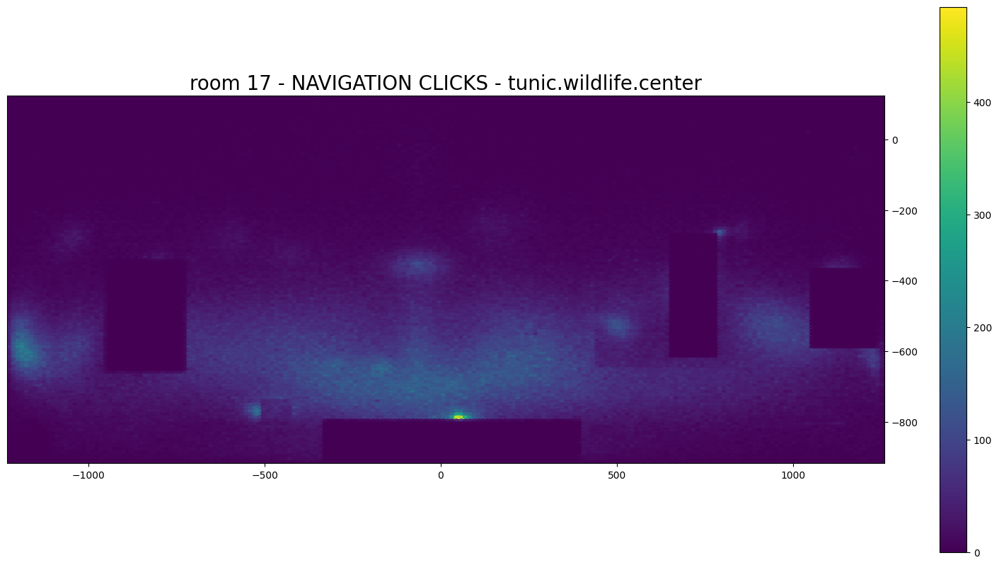

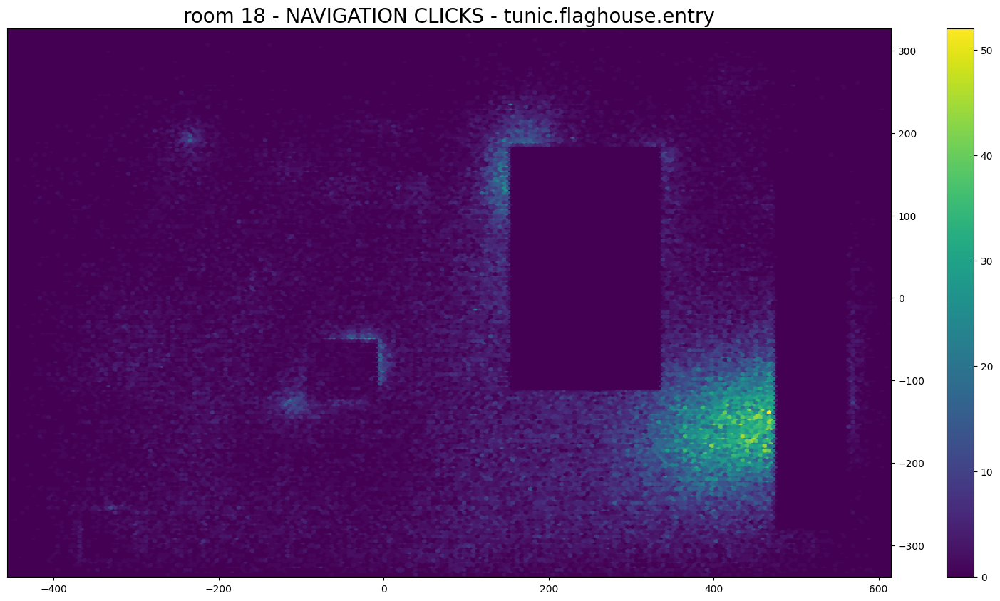

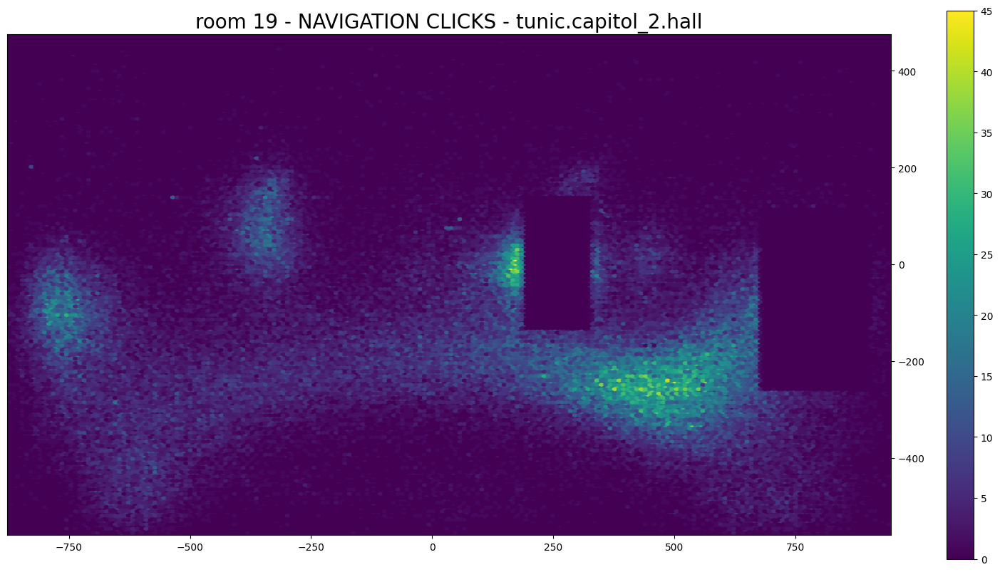

In [22]:
for idx, room_number in enumerate(rooms):

    df = train.loc[(train.event_name=='navigate_click')
                   &(train.room_fqid==room_number)&(train.fqid.isna())]
    x_min,y_min = df[['room_coor_x','room_coor_y']].min().values
    x_max,y_max = df[['room_coor_x','room_coor_y']].max().values

    plt.figure(figsize=(20,20))
    hb = plt.hexbin(df.room_coor_x,df.room_coor_y, gridsize=200)
    plt.colorbar(hb, shrink=0.5)

    plt.title(f'room {idx+1} - NAVIGATION CLICKS - {room_number}',size=20)
    plt.xlim((x_min,x_max))
    plt.ylim((y_min,y_max))
    plt.gca().set_aspect('equal')
    plt.gca().yaxis.tick_right()

    plt.show()

### Percentage of Questions Correct

We also visualize the percentage of questions that were answered correctly. We see that question 13 was particularly hard, followed by questions 15 and 16.

<Axes: xlabel='question', ylabel='correct'>

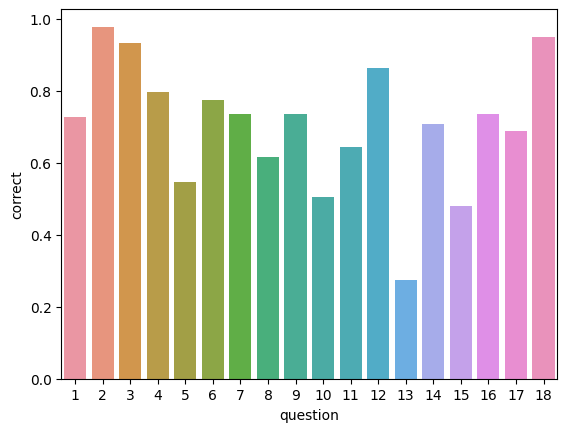

In [118]:
train_labels = pd.read_csv('kagglegameplaydata/train_labels.csv')

train_labels_fixed = train_labels.copy()
train_labels_fixed["question"] = train_labels_fixed["session_id"].str.split("_").apply(lambda x: x[1]).str.slice(1).astype(int)
train_labels_fixed["session_id"] = train_labels_fixed["session_id"].str.split("_").apply(lambda x: x[0])
train_labels_fixed.groupby("question")["correct"].mean()

train_labels_fixed.groupby(["question", "session_id"])["correct"].mean().reset_index()

sns.barplot(data=train_labels_fixed.groupby("question")["correct"].mean().reset_index(), x="question", y="correct")

## Modeling

In this section, we seek to tackle the question of predicting a users performance on a question given their previous performance and actions made in the game. This is effectively a classification task, as we want to predict whether someone answers the current question right or wrong. 

### Helpful Functions for Modeling

#### Reduce Memory Usage
This function reduces memory size by changing the data types of each feature so that the space efficiency is more optimal. We adapt this function from another kaggle user @arjanso.

In [51]:
#Reduce Memory Usage (Source: https://www.kaggle.com/code/mohammad2012191/reduce-memory-usage-2gb-780mb)

def reduce_memory_usage(df):
    '''
    This function is used to reduce the memory size by adapting the used data types
    param :
    df: Pandas DataFrame 
    '''
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype.name
        if ((col_type != 'datetime64[ns]') & (col_type != 'category')):
            if (col_type != 'object'):
                c_min = df[col].min()
                c_max = df[col].max()

                if str(col_type)[:3] == 'int':
                    if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                        df[col] = df[col].astype(np.int8)
                    elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                        df[col] = df[col].astype(np.int16)
                    elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                        df[col] = df[col].astype(np.int32)
                    elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                        df[col] = df[col].astype(np.int64)

                else:
                    if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                        df[col] = df[col].astype(np.float16)
                    elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                        df[col] = df[col].astype(np.float32)
                    else:
                        pass
            else:
                df[col] = df[col].astype('category')
    mem_usg = df.memory_usage().sum() / 1024**2 
    print("Memory usage became: ",mem_usg," MB")
    
    return df

#### Feature Engineer

This function preprocesses the training data set by calculating unique value count for categorical features and calculating the mean and standard deviation for numerical features, all grouped by session_id and level_group. It takes in the training pandas dataframe, as well as arrays denoting the categorical and numberical features, and the function returns a new dataframe with preprocessed features. 

In [48]:
# Getting numerical and categorical features (data preprocessing)

categorical_features = ['event_name', 'name','fqid', 'room_fqid', 'text_fqid']
numerical_features = ['elapsed_time','level','page','room_coor_x', 'room_coor_y', 'screen_coor_x', 'screen_coor_y', 'hover_duration']

print(f'Numerical features:', numerical_features)
print(f'Categorical features:', categorical_features)

Numerical features: ['elapsed_time', 'level', 'page', 'room_coor_x', 'room_coor_y', 'screen_coor_x', 'screen_coor_y', 'hover_duration']

Categorical features: ['event_name', 'name', 'fqid', 'room_fqid', 'text_fqid']


In [64]:
def feature_engineer(train_df):
    
    feature_dfs = []  # List to store the feature DataFrames for concatenation.

    # Calculate the number of unique values for each categorical feature.
    for cat_feature in categorical_features:
        cat_unique = train_df.groupby(['session_id', 'level_group'])[cat_feature].nunique()
        cat_unique.name = cat_feature + '_nunique'
        feature_dfs.append(cat_unique)

    # Calculate the mean for each numerical feature.
    for num_feature in numerical_features:
        num_mean = train_df.groupby(['session_id', 'level_group'])[num_feature].mean()
        feature_dfs.append(num_mean)

    # Calculate the standard deviation for each numerical feature.
    for num_feature in numerical_features:
        num_std = train_df.groupby(['session_id', 'level_group'])[num_feature].std()
        num_std.name = num_feature + '_std'
        feature_dfs.append(num_std)

    # Concatenate all the feature DataFrames and fill missing values with -1.
    feature_df = pd.concat(feature_dfs, axis=1)
    feature_df.fillna(-1, inplace=True)

    # Reset the index and set session_id as the new index.
    feature_df.reset_index(inplace=True)
    feature_df.set_index('session_id', inplace=True)

    return feature_df

## Data Preprocessing

In the next few cells, we load in train labels, reduce the memory usage of the training data set, and then do some feature engineering on the feautres present in the training data set before feeding this final pre-processe data frame into our modeling pipelines.

### Loading Train labels

In [49]:
targets = pd.read_csv('kagglegameplaydata/train_labels.csv')
targets['session'] = targets.session_id.apply(lambda x: int(x.split('_')[0]))
targets['q'] = targets.session_id.apply(lambda x: int(x.split('_')[-1][1:]))
print(targets.shape)
targets.head()

(424116, 4)


,session_id,correct,session,q
0,20090312431273200_q1,1,20090312431273200,1
1,20090312433251036_q1,0,20090312433251036,1
2,20090312455206810_q1,1,20090312455206810,1
3,20090313091715820_q1,0,20090313091715820,1
4,20090313571836404_q1,1,20090313571836404,1


### Applying Reduce Memory Usage Function

We apply the previously defined Reduce Memory Usage function to training data and testing data so it is less resource intensive on our machines.

In [82]:
print('''For target data set
=====================''')
targets = reduce_memory_usage(targets)
print('\n')
print('''For training data set
=====================''')
train = reduce_memory_usage(train)

For target data set


Memory usage of dataframe is 25.02 MB

Memory usage became:  25.02347183227539  MB





For training data set


Memory usage of dataframe is 1028.26 MB

Memory usage became:  1028.2593364715576  MB


### Applying Feature Engineer Function

We apply the previously defined feature engineer function to training data.

In [65]:
df = feature_engineer(train)
print( df.shape )
df.head()

(70686, 22)


,level_group,event_name_nunique,name_nunique,fqid_nunique,room_fqid_nunique,text_fqid_nunique,elapsed_time,level,page,room_coor_x,...,screen_coor_y,hover_duration,elapsed_time_std,level_std,page_std,room_coor_x_std,room_coor_y_std,screen_coor_x_std,screen_coor_y_std,hover_duration_std
session_id,,,,,,,,,,,,,,,,,,,,,
20090312431273200,0-4,10,3,30,7,17,8.579356e+04,1.945455,-1.0,7.688968,...,383.044861,2389.500000,49246.539458,1.230975,-1.000000,399.272451,129.295749,214.871000,104.082743,3227.370757
20090312431273200,13-22,10,3,49,12,35,1.040601e+06,17.402381,-1.0,-130.360092,...,379.301025,899.925903,126666.129584,2.358652,-1.000000,622.081128,230.373785,240.280218,99.067861,1305.088265
20090312431273200,5-12,10,3,39,11,24,3.572052e+05,8.054054,-1.0,14.306852,...,378.784912,969.333313,80175.676658,2.096919,-1.000000,357.219911,137.409158,203.268560,120.255453,1316.408315
20090312433251036,0-4,11,4,22,6,11,9.763342e+04,1.870504,0.0,-84.042580,...,370.723083,1378.750000,67372.714092,1.232616,0.000000,445.973993,156.183163,252.554707,121.062929,2114.876406
20090312433251036,13-22,11,6,73,16,43,2.498852e+06,17.762529,5.1,-30.756248,...,387.930084,720.384949,777382.529186,1.825923,0.863075,529.564669,234.275228,259.288856,133.345693,1990.705518


## Baseline Model: Logistic Regression

A baseline model is a simple model that we will use as a point of reference for evaluating the performance of other models. We can use the heuristic that our baseline model has the minimum level of performance in ordered to be useful.

We decided to use a logistic regression as our baseline model for this classification task because it is a simple and interpretable linear model that can provide reasonable performance in many situations. It is fast to train and provides probability estimates for each class, which we can then set thresholds on to predict if a question is answered correctly or not. 

Based on the coefficients of the logistic regression, we can also assign importance to select features.

In [98]:
FEATURES = [c for c in df.columns if c != 'level_group']
print('We will train our model with', len(FEATURES) ,'features')
ALL_USERS = df.index.unique()
print('We will train our model with', len(ALL_USERS) ,'users info')

We will train our model with 21 features

We will train our model with 23562 users info


In [103]:
gkf = GroupKFold(n_splits=5)
oof = pd.DataFrame(data=np.zeros((len(ALL_USERS),18)), index=ALL_USERS)
LR_models = {}

# ITERATE THRU QUESTIONS 1 THRU 18
for t in range(1,19):
    print('#'*40)
    print(' '*14, 'Question',t)
    print('#'*40)
    
    # COMPUTE CV SCORE WITH 5 GROUP K FOLD
    for i, (train_index, test_index) in enumerate(gkf.split(X=df, groups=df.index)):
        print(f'Fold {i+1} ', end='')
        
        # USE THIS TRAIN DATA WITH THESE QUESTIONS
        if t<=3: grp = '0-4'
        elif t<=13: grp = '5-12'
        elif t<=22: grp = '13-22'
            
        # TRAIN DATA
        train_x = df.iloc[train_index]
        train_x = train_x.loc[train_x.level_group == grp]
        train_users = train_x.index.values
        train_y = targets.loc[targets.q==t].set_index('session').loc[train_users]
        
        # VALID DATA
        valid_x = df.iloc[test_index]
        valid_x = valid_x.loc[valid_x.level_group == grp]
        valid_users = valid_x.index.values
        valid_y = targets.loc[targets.q==t].set_index('session').loc[valid_users]
        
        # TRAIN MODEL
        if f'{grp}_{t}' not in LR_models:
            clf = LogisticRegression(max_iter=500)
            LR_models[f'{grp}_{t}'] = clf
        else:
            clf = LR_models[f'{grp}_{t}']
            
        clf.fit(train_x[FEATURES].astype('float32'), train_y['correct'])
        
        # PREDICT VALID OOF
        oof.loc[valid_users, t-1] = clf.predict_proba(valid_x[FEATURES].astype('float32'))[:,1]
        
    print()



########################################

               Question 1

########################################

Fold 1 Fold 2 Fold 3 Fold 4 Fold 5 

########################################

               Question 2

########################################

Fold 1 Fold 2 Fold 3 Fold 4 Fold 5 

########################################

               Question 3

########################################

Fold 1 Fold 2 Fold 3 Fold 4 Fold 5 

########################################

               Question 4

########################################

Fold 1 Fold 2 Fold 3 Fold 4 Fold 5 

########################################

               Question 5

########################################

Fold 1 Fold 2 Fold 3 Fold 4 Fold 5 

########################################

               Question 6

########################################

Fold 1 Fold 2 Fold 3 Fold 4 Fold 5 

########################################

               Question 7

########################################

F

In [107]:
# Concatenate feature names and coefficients
feature_importances = pd.DataFrame({'feature': FEATURES, 'importance': clf.coef_[0]})

# Sort features by absolute value of importance
feature_importances['abs_importance'] = feature_importances['importance'].abs()
feature_importances = feature_importances.sort_values('abs_importance', ascending=False)

# Top 10 features
print(feature_importances)

               feature    importance  abs_importance

16     room_coor_x_std  1.480109e-03    1.480109e-03

10       screen_coor_x  1.158414e-03    1.158414e-03

11       screen_coor_y  9.758873e-04    9.758873e-04

12      hover_duration  7.939550e-04    7.939550e-04

18   screen_coor_x_std  6.226825e-04    6.226825e-04

17     room_coor_y_std  6.068660e-04    6.068660e-04

9          room_coor_y -4.474597e-04    4.474597e-04

19   screen_coor_y_std  2.934320e-04    2.934320e-04

8          room_coor_x -2.467823e-04    2.467823e-04

2         fqid_nunique  1.269872e-04    1.269872e-04

4    text_fqid_nunique  8.089533e-05    8.089533e-05

20  hover_duration_std -7.069041e-05    7.069041e-05

6                level  4.310445e-05    4.310445e-05

3    room_fqid_nunique  3.079650e-05    3.079650e-05

0   event_name_nunique  2.388165e-05    2.388165e-05

1         name_nunique  9.705653e-06    9.705653e-06

7                 page  8.583915e-06    8.583915e-06

14           level_std  5.78

In [69]:
# GET TRUE LABELS
true = oof.copy()
for k in range(18):
    tmp = targets.loc[targets.q == k+1]
    tmp = tmp.set_index('session').loc[ALL_USERS]
    true[k] = tmp.correct.values

In [73]:
# FIND BEST THRESHOLD AND SCORE

scores = []
thresholds = np.arange(0.4, 0.81, 0.01)

for threshold in thresholds:
    print(f'{threshold:.02f}, ', end='')
    preds = (oof.values.reshape((-1)) > threshold).astype('int')
    m = f1_score(true.values.reshape((-1)), preds, average='macro')   
    scores.append(m)

best_idx = np.argmax(scores)
LR_best_score = scores[best_idx]
LR_best_threshold = thresholds[best_idx]

print('\n' ,'Best_score:', LR_best_score, '\n', 'Best_threshold:', LR_best_threshold)


0.40, 0.41, 0.42, 0.43, 0.44, 0.45, 0.46, 0.47, 0.48, 0.49, 0.50, 0.51, 0.52, 0.53, 0.54, 0.55, 0.56, 0.57, 0.58, 0.59, 0.60, 0.61, 0.62, 0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69, 0.70, 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.80, 

 Best_score: 0.6481008968572912 

 Best_threshold: 0.5700000000000002


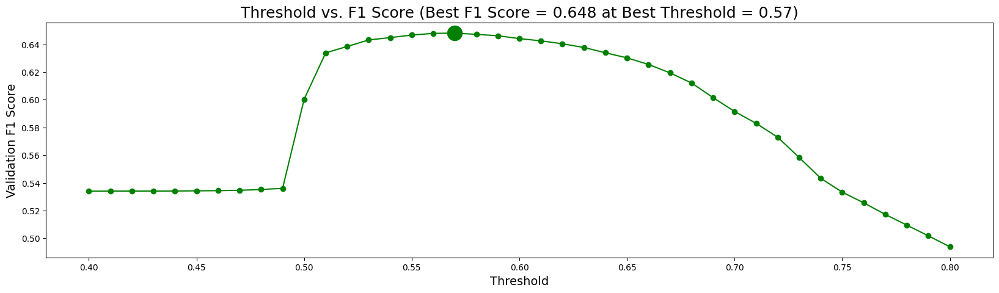

In [74]:
# THRESHOLD VS F1 SCORE PLOT

plt.figure(figsize=(20,5))

plt.plot(thresholds,scores,'-o',color='green')
plt.scatter([LR_best_threshold], [LR_best_score], color='green', s=300, alpha=1)

plt.xlabel('Threshold',size=14)
plt.ylabel('Validation F1 Score',size=14)
plt.title(f'Threshold vs. F1 Score (Best F1 Score = {LR_best_score:.3f} at Best Threshold = {LR_best_threshold:.3})',size=18)
plt.show()

In [92]:
q_f1_scores = [f1_score(true[k].values, (oof[k].values>LR_best_threshold).astype('int'), average='macro') for k in range(18)]
overall_f1_score = f1_score(true.values.reshape((-1)), (oof.values.reshape((-1))>LR_best_threshold).astype('int'), average='macro')

print('When using optimal threshold...')
for k, f1_score in enumerate(q_f1_scores):
    print(f'Question {k}: F1 = {f1_score:.3f}')

print(f'Overall F1 score: {overall_f1_score:.3f}')


When using optimal threshold...

Question 0: F1 = 0.470

Question 1: F1 = 0.497

Question 2: F1 = 0.484

Question 3: F1 = 0.447

Question 4: F1 = 0.324

Question 5: F1 = 0.448

Question 6: F1 = 0.478

Question 7: F1 = 0.474

Question 8: F1 = 0.448

Question 9: F1 = 0.332

Question 10: F1 = 0.512

Question 11: F1 = 0.464

Question 12: F1 = 0.421

Question 13: F1 = 0.415

Question 14: F1 = 0.342

Question 15: F1 = 0.427

Question 16: F1 = 0.432

Question 17: F1 = 0.487

Overall F1 score: 0.648


We see that the overall F1 score of our baseline logistic regression model is 0.648. This is a decent score that we will try to beat with random forest, xgboost, and neural network models.

## Model: Random Forest

A random forest is a model that can be used for classification. It is an ensemble method that combines multiple decision trees, where each tree is trained on a subset of the training data and a random subset of the input features.

Random forests have several advantages over logistic regression. First, random forests are able to model non-linear relationships between input features. Second, random forests are less sensitive to outliers and noisy data. Third, random forests can capture interactions between features. Because we are bagging our data, we expect the random forests may be more resistant to overfitting than logistic regression.

We can also determine feature importance based on the output of the random forest.

The main downside to random forest models are that they are much more resource intensive.

In [108]:
oof = pd.DataFrame(data=np.zeros((len(ALL_USERS), 18)), index=ALL_USERS)
RFC_models = {}

# ITERATE THROUGH QUESTIONS 1 THRU 18
for t in range(1, 19):
    print('#'*40)
    print(' '*14, 'Question',t)
    print('#'*40)

    # USE THIS TRAIN DATA WITH THESE QUESTIONS
    if t <= 3:
        grp = '0-4'
    elif t <= 13:
        grp = '5-12'
    elif t <= 22:
        grp = '13-22'

    # GET DATA FOR THIS QUESTION AND GROUP
    data = df.loc[df.level_group == grp][FEATURES]
    targets_q = targets.loc[targets.q == t].set_index('session').reindex(data.index)

    # COMPUTE CV SCORE WITH 5 GROUP K FOLD
    cv = GroupKFold(n_splits=5)
    for i, (train_index, test_index) in enumerate(cv.split(X=data, groups=data.index)):
        print('Fold', i + 1)

        # TRAIN AND VALIDATION DATA
        train_x, valid_x = data.iloc[train_index], data.iloc[test_index]
        train_y, valid_y = targets_q.iloc[train_index], targets_q.iloc[test_index]

        # TRAIN MODEL
        clf = RandomForestClassifier()
        clf.fit(train_x.astype('float32'), train_y['correct'])

        # SAVE MODEL AND PREDICT VALID OOF
        RFC_models[f'{grp}_{t}_{i+1}'] = clf
        oof.loc[valid_x.index, t - 1] = clf.predict_proba(valid_x.astype('float32'))[:, 1]
print()

########################################

               Question 1

########################################

Fold 1

Fold 2

Fold 3

Fold 4

Fold 5

########################################

               Question 2

########################################

Fold 1

Fold 2

Fold 3

Fold 4

Fold 5

########################################

               Question 3

########################################

Fold 1

Fold 2

Fold 3

Fold 4

Fold 5

########################################

               Question 4

########################################

Fold 1

Fold 2

Fold 3

Fold 4

Fold 5

########################################

               Question 5

########################################

Fold 1

Fold 2

Fold 3

Fold 4

Fold 5

########################################

               Question 6

########################################

Fold 1

Fold 2

Fold 3

Fold 4

Fold 5

########################################

               Question 7

#########################

In [112]:
# FIND BEST THRESHOLD AND SCORE

scores = []
thresholds = np.arange(0.4, 0.81, 0.01)

for threshold in thresholds:
    print(f'{threshold:.02f}, ', end='')
    preds = (oof.values.reshape((-1)) > threshold).astype('int')
    m = f1_score(true.values.reshape((-1)), preds, average='macro')   
    scores.append(m)

best_idx = np.argmax(scores)
RFC_best_score = scores[best_idx]
RFC_best_threshold = thresholds[best_idx]

print('\n' ,'Best_score:', RFC_best_score, '\n', 'Best_threshold:', RFC_best_threshold)

0.40, 0.41, 0.42, 0.43, 0.44, 0.45, 0.46, 0.47, 0.48, 0.49, 0.50, 0.51, 0.52, 0.53, 0.54, 0.55, 0.56, 0.57, 0.58, 0.59, 0.60, 0.61, 0.62, 0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69, 0.70, 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.80, 

 Best_score: 0.6648256297705878 

 Best_threshold: 0.6000000000000002


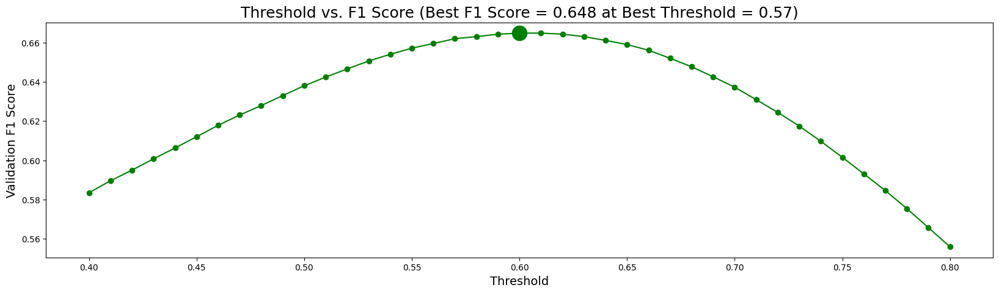

In [113]:
# PLOT THRESHOLD VS. F1_SCORE
plt.figure(figsize=(20,5))

plt.plot(thresholds,scores,'-o',color='green')
plt.scatter([RFC_best_threshold], [RFC_best_score], color='green', s=300, alpha=1)

plt.xlabel('Threshold',size=14)
plt.ylabel('Validation F1 Score',size=14)
plt.title(f'Threshold vs. F1 Score (Best F1 Score = {LR_best_score:.3f} at Best Threshold = {LR_best_threshold:.3})',size=18)
plt.show()

In [114]:
q_f1_scores = [f1_score(true[k].values, (oof[k].values>LR_best_threshold).astype('int'), average='macro') for k in range(18)]
overall_f1_score = f1_score(true.values.reshape((-1)), (oof.values.reshape((-1))>LR_best_threshold).astype('int'), average='macro')

print('When using optimal threshold...')
for k, f1_score in enumerate(q_f1_scores):
    print(f'Question {k}: F1 = {f1_score:.3f}')

print(f'Overall F1 score: {overall_f1_score:.3f}')


When using optimal threshold...

Question 0: F1 = 0.533

Question 1: F1 = 0.495

Question 2: F1 = 0.484

Question 3: F1 = 0.568

Question 4: F1 = 0.582

Question 5: F1 = 0.572

Question 6: F1 = 0.551

Question 7: F1 = 0.543

Question 8: F1 = 0.566

Question 9: F1 = 0.557

Question 10: F1 = 0.564

Question 11: F1 = 0.477

Question 12: F1 = 0.448

Question 13: F1 = 0.571

Question 14: F1 = 0.544

Question 15: F1 = 0.462

Question 16: F1 = 0.504

Question 17: F1 = 0.487

Overall F1 score: 0.662


We see that the overall F1 score of our random forest model is 0.662. This is a slight improvement over our baseline.

## Model: Question-Based XGBoost with Batched Previous Question Predictions

This model entails creating individual XGBoost models for each of the 18 questions across the 3 level groups. However, to add more metrics, we wanted to incorporate a user's previous question performance to allow our model to explore the relationship between different questions. The first version of this model isolates individual groups further than the next model, but in summary, incorporates previous question performance only when examining a group that has questions completed before it.

### Some Additional Code Preprocessing

In [8]:
# formatting y_train
x_train_engineered = pd.read_csv('/kaggle/input/jo-wilder-train-engineered/train_engineered_1.csv')
x_train_engineered = x_train_engineered.replace([np.nan, np.inf, -np.inf], 0)
labels = pd.read_csv('/kaggle/input/jo-wilder-train-labels/train_labels.csv')

labels[['session_id', 'question']] = labels['session_id'].str.split('_', expand=True)
labels['session_id'] = labels['session_id'].astype('int64')
y_train_engineered = labels

# Needed for proper sorting
y_train_engineered['question'] = y_train_engineered['question'].str.slice(1).astype(int)

# Pivot DF
y_train_engineered = y_train_engineered.sort_values(['session_id', 'question'])
y_train_engineered = y_train_engineered.pivot(index='session_id', columns='question', values='correct')
y_train_engineered.columns = ['question_' + str(col) for col in y_train_engineered.columns]
y_train_engineered = y_train_engineered.reset_index()

# ------

# Getting all unique session_id values to split on (because we have grouped data)
unique_sessions = x_train_engineered['session_id'].unique()

# Split the data into training and testing sets based on the unique values
train_sessions, test_sessions = train_test_split(unique_sessions, test_size=0.2, random_state=42)

# Filter x_train and x_test based on train / test data
x_train = x_train_engineered[x_train_engineered['session_id'].isin(train_sessions)]
y_train = y_train_engineered[y_train_engineered['session_id'].isin(train_sessions)]
x_test = x_train_engineered[x_train_engineered['session_id'].isin(test_sessions)]
y_test = y_train_engineered[y_train_engineered['session_id'].isin(test_sessions)]

# Sort for Proper Ordering
x_train = x_train.sort_values('session_id')
y_train = y_train.sort_values('session_id')
x_test = x_test.sort_values('session_id')
y_test = y_test.sort_values('session_id')

In [9]:
# Training XGBoost Models for each question based on engineered features and previous group's question performance

# Initialize some empty objects to be used in looping function
question_models_lvlgroup = {}
prev_questions = pd.DataFrame(unique_sessions, columns=['session_id'])

# Mapping of level groups to questions
limits = {'0-4':(1,4), '5-12':(4,14), '13-22':(14,19)}

# Iterate through all Level Groupings
for levels in limits.keys():
    # Filter to focus on current level group
    x_train_temp = x_train[x_train['level_group'] == levels]
    
    # Only incorporate previous performance data if processing a new group
    if prev_questions.shape[1] > 1:
        x_train_temp = pd.merge(x_train_temp, prev_questions, on='session_id')
    
    first_q, last_q = limits[levels]
    
    # Iterate through all questions in a group, creating an XGBoost Model for each
    for q in range(first_q, last_q):
        y_train_temp = y_train[['session_id', f"question_{q}"]]
        model = xgb.XGBClassifier()
        model.fit(x_train_temp.drop(columns=['level_group']), y_train_temp[f"question_{q}"])
        
        # Storing model
        question_models_lvlgroup[q] = model
        
        # Updating previous question performance to local storage
        prev_questions = pd.merge(prev_questions, y_train_temp[['session_id', f"question_{q}"]], on='session_id')

Above, we are creating individual XGBoost models for each question, as we have seen that each question in the data varies in terms of difficulty, accuracy, and information requested of the user. In this version of model training, we put a higher emphasis on group training, treating each level grouping as "separate entities", only allowing groups to access previous performance from different level groupings. We thought this may generate some interesting insights.

In [12]:
from sklearn.metrics import confusion_matrix

In [13]:
# Testing Question-Based XGBoost Models with test data

confusion_matrices = []

# Initialize some empty objects to be used in looping function
model_accuracy = {}
prev_limits = {'0-4': None, '5-12': (1,4), '13-22': (4,14)}

# Stores the model's predictions of previous questions
prev_predictions = pd.DataFrame(unique_sessions, columns=['session_id'])

# Iterate through all Level Groupings
for levels in limits.keys():
    # Filter to focus on current level group
    x_test_temp = x_test[x_test['level_group'] == levels]
    
    # Only incorporate previous performance data if processing a new group
    if prev_predictions.shape[1] > 1:
        x_test_temp = pd.merge(x_test_temp, prev_predictions, on='session_id')
    
    first_q, last_q = limits[levels]
    
    # Iterate through all questions in a group, testing our XGBoost Models against test data
    for q in range(first_q, last_q):
        y_test_temp = y_test[['session_id', f"question_{q}"]]
        # Getting stored model
        model = question_models_lvlgroup[q]
        # Making predictions
        y_pred_temp = model.predict(x_test_temp.drop(columns=['level_group']))
        
        # Creating predictions array and adding it to local storage of previous predictions
        predictions = [round(value) for value in y_pred_temp]
        temp = pd.DataFrame({
            'session_id': x_test_temp['session_id'],
            f"question_{q}": predictions
        })
        prev_predictions = pd.merge(prev_predictions, temp, on='session_id')
        
        # Saving model performance
        accuracy = accuracy_score(y_test_temp[f"question_{q}"], predictions)
        f1 = f1_score(y_test_temp[f"question_{q}"], predictions)
        confusion_matrices.append(confusion_matrix(y_test_temp[f"question_{q}"], predictions))
        model_accuracy[q] = [ ('accuracy', accuracy * 100.0), ('f1', f1) ]

# Outputting model performance per level
print(json.dumps(model_accuracy, indent=2))

# Outputting overall statistics
vals = model_accuracy.values()
acc_total = 0
f1_total = 0
for obj in vals:
    acc_total += obj[0][1]
    f1_total += obj[1][1]
print("")
print(f"Overall Accuracy: {acc_total / len(vals)}")
print(f"Overall F1 Score: {f1_total / len(vals)}")

{
  "1": [
    [
      "accuracy",
      71.7377466581795
    ],
    [
      "f1",
      0.8259733472694016
    ]
  ],
  "2": [
    [
      "accuracy",
      97.94186293231488
    ],
    [
      "f1",
      0.9896023153607032
    ]
  ],
  "3": [
    [
      "accuracy",
      93.2102694674305
    ],
    [
      "f1",
      0.96484289167216
    ]
  ],
  "4": [
    [
      "accuracy",
      79.52471886272014
    ],
    [
      "f1",
      0.8826747720364742
    ]
  ],
  "5": [
    [
      "accuracy",
      59.45257797581158
    ],
    [
      "f1",
      0.6675943642372587
    ]
  ],
  "6": [
    [
      "accuracy",
      77.5726713346064
    ],
    [
      "f1",
      0.8693610184155234
    ]
  ],
  "7": [
    [
      "accuracy",
      72.50159134309358
    ],
    [
      "f1",
      0.8346938775510204
    ]
  ],
  "8": [
    [
      "accuracy",
      59.43136006789731
    ],
    [
      "f1",
      0.7178276269185361
    ]
  ],
  "9": [
    [
      "accuracy",
      73.35030765966476
  

We see that the overall F1 score of our first XGBoost model is 0.788, and the overall accuracy is 0.737.

There's a reasonable amount of deviation in the accuracy metrics for each level from a quick glance, and we can see the F1 scores are generally high except for level 13, which we suspect comes from the fact that this is the first question in the final group that has access to the second wave of prediction data. It could be a vastly different question than others the model has experienced at that point, which is supported by the large amount of time taken on average for question 13, as shown in the EDA.

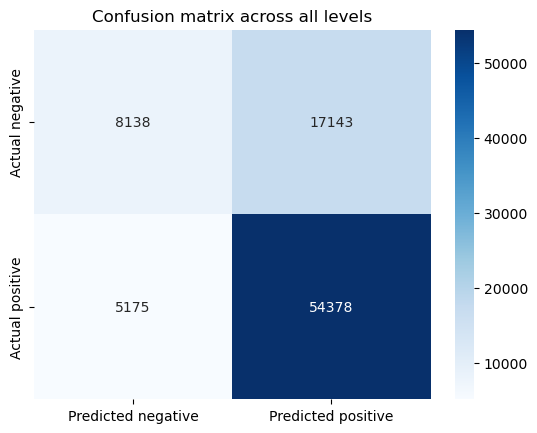

In [28]:
g = sns.heatmap(pd.DataFrame(np.asarray(confusion_matrices).sum(axis=0), index = ["Actual negative", "Actual positive"],
                  columns = ["Predicted negative", "Predicted positive"]), annot=True, cmap='Blues', fmt='g')
plt.title("Confusion matrix across all levels")
plt.show()

This is a confusion matrix depicting what items the model got right and wrong, depending on whether or not they were actual questions getting right are wrong. As can be seen here, the model has a slight bias towards predicting that the user gets the question correct.

## Model: Question-Based XGBoost with Continuous Previous Question Predictions

This model entails creating individual XGBoost models for each of the 18 questions across the 3 level groups. The second version of this model incorporates previous question performance whenever accessible.

In [21]:
# Training XGBoost Models for each question based on engineered features and ALL previous questions' performance

# Initialize some empty objects to be used in looping function
question_models_lvls = {}
prev_questions = pd.DataFrame(unique_sessions, columns=['session_id'])

# Mapping of level groups to questions
limits = {'0-4':(1,4), '5-12':(4,14), '13-22':(14,19)}

# Iterate through all Level Groupings
for levels in limits.keys():
    # Filter to focus on current level group
    x_train_group = x_train[x_train['level_group'] == levels]
    
    first_q, last_q = limits[levels]
    
    # Iterate through all questions in a group, creating an XGBoost Model for each
    for q in range(first_q, last_q):
        x_train_temp = x_train_group.copy()
        
        # Only previous performance data per question
        if prev_questions.shape[1] > 1:
            x_train_temp = pd.merge(x_train_temp, prev_questions, on='session_id')
        
        y_train_temp = y_train[['session_id', f"question_{q}"]]
        model = xgb.XGBClassifier()
        model.fit(x_train_temp.drop(columns=['level_group']), y_train_temp[f"question_{q}"])
        
        # Storing model
        question_models_lvls[q] = model
        
        # Updating previous question performance to local storage
        prev_questions = pd.merge(prev_questions, y_train_temp[['session_id', f"question_{q}"]], on='session_id')

Similar to the process above, we are creating models for each question, but just incorporating guess data whenever there is new information.

In [22]:
# Testing Question-Based XGBoost Models with test data

# Initialize some empty objects to be used in looping function
model_accuracy = {}
prev_limits = {'0-4': None, '5-12': (1,4), '13-22': (4,14)}

# Stores the model's predictions of previous questions
prev_predictions = pd.DataFrame(unique_sessions, columns=['session_id'])

# Iterate through all Level Groupings
for levels in limits.keys():
    # Filter to focus on current level group
    x_test_group = x_test[x_test['level_group'] == levels]
    
    first_q, last_q = limits[levels]
    
    # Iterate through all questions in a group, testing our XGBoost Models against test data
    for q in range(first_q, last_q):
        x_test_temp = x_test_group.copy()
        
        # Incorporate previous performance data for each question
        if prev_predictions.shape[1] > 1:
            x_test_temp = pd.merge(x_test_temp, prev_predictions, on='session_id')
        
        y_test_temp = y_test[['session_id', f"question_{q}"]]
        # Getting stored model
        model = question_models_lvls[q]
        # Making predictions
        y_pred_temp = model.predict(x_test_temp.drop(columns=['level_group']))
        
        # Creating predictions array and adding it to local storage of previous predictions
        predictions = [round(value) for value in y_pred_temp]
        temp = pd.DataFrame({
            'session_id': x_test_temp['session_id'],
            f"question_{q}": predictions
        })
        prev_predictions = pd.merge(prev_predictions, temp, on='session_id')
        
        # Saving model performance
        accuracy = accuracy_score(y_test_temp[f"question_{q}"], predictions)
        f1 = f1_score(y_test_temp[f"question_{q}"], predictions)
        model_accuracy[q] = [ ('accuracy', accuracy * 100.0), ('f1', f1) ]

# Outputting model performance per level
print(json.dumps(model_accuracy, indent=2))

# Outputting overall statistics
vals = model_accuracy.values()
acc_total = 0
f1_total = 0
for obj in vals:
    acc_total += obj[0][1]
    f1_total += obj[1][1]
print("")
print(f"Overall Accuracy: {acc_total / len(vals)}")
print(f"Overall F1 Score: {f1_total / len(vals)}")

{
  "1": [
    [
      "accuracy",
      71.7377466581795
    ],
    [
      "f1",
      0.8259733472694016
    ]
  ],
  "2": [
    [
      "accuracy",
      97.9206450244006
    ],
    [
      "f1",
      0.9894939965694683
    ]
  ],
  "3": [
    [
      "accuracy",
      93.1253978357734
    ],
    [
      "f1",
      0.9643877775335238
    ]
  ],
  "4": [
    [
      "accuracy",
      79.50350095480586
    ],
    [
      "f1",
      0.8825389105058365
    ]
  ],
  "5": [
    [
      "accuracy",
      59.28283471249735
    ],
    [
      "f1",
      0.6840111971019266
    ]
  ],
  "6": [
    [
      "accuracy",
      77.08465945257798
    ],
    [
      "f1",
      0.8655713218820016
    ]
  ],
  "7": [
    [
      "accuracy",
      73.01082113303629
    ],
    [
      "f1",
      0.838701496322597
    ]
  ],
  "8": [
    [
      "accuracy",
      59.30405262041163
    ],
    [
      "f1",
      0.7217063261752756
    ]
  ],
  "9": [
    [
      "accuracy",
      72.65011669849353
 

We see that the overall F1 score of our second XGBoost model is 0.798, and the overall accuracy is 0.734.

As we can see through the accuracy score above, there was not much of a change compared to the previous model in terms of overall accuracy.

# Bonus model: user click/log embeddings

As an extra step, we wanted to see if it was possible to extract richer information than just aggregate statistics for each user in order to use as input for our model.

The main problem with this is that the click/log data is complex (contains different types of events, etc.) and the length of the logs can vary for each user. Therefore, we plan to use PyTorch (as taught in HW5) to create a "click embedding" model that will learn a latent representation of the user click/log data. Once we have this model, we can simply convert each sequence of log data to a feature vector by passing it through our vector, where the feature vector will be a fixed length no matter the number of clicks. For our approach to training the model, we will simply mask some of the click data and have the model predict the missing click vectors. A "click vector" refers to a vector representing a single interaction, which may include the event type, location of the click, and duration since the last click.
 
While we didn't have enough time to use these embeddings as features for our main classifiers, the generated embeddings are certainly interesting in of themselves, and would allow for other types of analysis such as clustering.

In [1]:
from sklearn.preprocessing import StandardScaler
from torch.utils.data import Dataset, DataLoader

# Should be run individually on each LEVEL, since scaling will be different for each
def generate_init_click_vectors(click_df):
    click = pd.concat([click_df, pd.get_dummies(click_df["event_name"])], axis=1).drop(columns=["event_name"])

    x_scaler = StandardScaler()
    y_scaler = StandardScaler()
    click["room_coor_x"] = x_scaler.fit_transform(click[["room_coor_x"]])
    click["room_coor_y"] = x_scaler.fit_transform(click[["room_coor_y"]])

    time_scaler = StandardScaler()
    click["elapsed_time_diff"] = click["elapsed_time"].diff()
    click["elapsed_time_diff"] = click["elapsed_time_diff"].fillna(0)
    click["elapsed_time_diff"].loc[click["elapsed_time_diff"] < 0] = 0
    click["elapsed_time_diff"] = time_scaler.fit_transform(click[["elapsed_time_diff"]])
    
    hover_scaler = StandardScaler()
    click["hover_duration"] = hover_scaler.fit_transform(click[["hover_duration"]])

    click.drop(columns=["elapsed_time"], inplace=True)
    click = click.fillna(0)
    return click

In [ ]:
click_inits = train.groupby("level")[["session_id", "level", "elapsed_time", "event_name", "room_coor_x", "room_coor_y", "hover_duration"]].apply(generate_init_click_vectors)

In [ ]:
click_inits.describe()

In [ ]:
# Custom dataset that stores all of the click/log data
class ClickDataset(Dataset):
    def __init__(self, level=0, transform=None, target_transform=None):
        self.VECTOR_LENGTH = 64
        self.MASK_AMT = 0.1
        self.NUM_COLUMNS = 16
        self.MASK_VECTOR = -np.ones((self.NUM_COLUMNS))
        
        self.level = level
        
        # Get click data
        self.click_inits = click_inits.loc[click_inits["level"] == level].set_index("session_id")
        
        # We need to create a map from session ids to the indexes (so the first item is idx 0, then 1, etc.)
        self.session_ids_map = {idx: session_id for idx, session_id in enumerate(self.click_inits.index.unique())}
        
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.session_ids_map)

    # This should return a vector of dimension (VECTOR_LENGTH, NUM_COLUMNS)
    def __getitem__(self, idx):
        session_id = self.session_ids_map[idx]
        click_vector = np.float32(self.click_inits.loc[session_id].values)
        
        # Pad/truncate the vector
        old_length = click_vector.shape[0]
        
        # We need to pass in a vector indicating how much of the sequence was padded, since
        # we want to ignore those values with attention later
        click_vector_paddings = np.full((self.VECTOR_LENGTH), False)
        
        # Truncate
        if old_length > self.VECTOR_LENGTH:
            click_vector = click_vector[:self.VECTOR_LENGTH, :]
        
        # Pad
        elif old_length < self.VECTOR_LENGTH:
            click_vector = np.pad(click_vector, pad_width=((0, self.VECTOR_LENGTH - old_length), (0, 0)), constant_values=0)
            click_vector_paddings[old_length:] = True
            
        # Now we need to create the "labels", which are just the sequences, except with random masks
        np.random.seed(idx)
        mask_indices = np.random.choice(
            np.arange(click_vector.shape[0]), 
            size=(int(click_vector.shape[0] * self.MASK_AMT))
        )
        click_vector_masked = click_vector.copy()
        click_vector_masked[mask_indices, :] = self.MASK_VECTOR
        
        # Finally, apply transforms
        if self.transform:
            click_vector = self.transform(image)
        
        return click_vector, click_vector_masked, click_vector_paddings

In [ ]:
from torch.utils.data import random_split

click_train, click_test = random_split(ClickDataset(level=0), lengths=[0.8, 0.2])

train_dataloader = DataLoader(click_train, batch_size=64, shuffle=True)
test_dataloader = DataLoader(click_test, batch_size=64, shuffle=True)

## Define model

We define our model as a simple encoder using multi-head attention

In [ ]:
# Very simple encoder with attention
class JoWilderClickCis5450Encoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.INPUT_DIM = 16
        self.EMBEDDING_DIM = 32
        self.NUM_HEADS = 4
        self.BLOCKS = 4
        
        self.query_linear = nn.Linear(self.INPUT_DIM, self.EMBEDDING_DIM)
        self.key_linear = nn.Linear(self.INPUT_DIM, self.EMBEDDING_DIM)
        self.value_linear = nn.Linear(self.INPUT_DIM, self.EMBEDDING_DIM)
        
        # By default, torch's attention module expects the sequence length S to be the first dim, but we have N as the first dim
        self.mh_attention = nn.MultiheadAttention(embed_dim=self.EMBEDDING_DIM, num_heads=self.NUM_HEADS, batch_first=True)
        self.final = nn.Linear(self.EMBEDDING_DIM, self.INPUT_DIM)

    def forward(self, x, x_mask):
        q, k, v = self.query_linear(x), self.key_linear(x), self.value_linear(x)
        attn_output, attn_output_weights = self.mh_attention(q, k, v, key_padding_mask=x_mask)
        final = self.final(attn_output)
        
        return final

In [ ]:
jw_encoder = JoWilderClickCis5450Encoder()

```
JoWilderClickCis5450Encoder(
  (query_linear): Linear(in_features=16, out_features=32, bias=True)
  (key_linear): Linear(in_features=16, out_features=32, bias=True)
  (value_linear): Linear(in_features=16, out_features=32, bias=True)
  (mh_attention): MultiheadAttention(
    (out_proj): NonDynamicallyQuantizableLinear(in_features=32, out_features=32, bias=True)
  )
  (final): Linear(in_features=32, out_features=16, bias=True)
)
```

## Loss and optimizer

Typically for these types of "embedding" tasks, we'd want to use a cross entropy loss, as we'd be predicting what tokens (clicks) are missing. However, our task is slightly different since we don't have a "vocabulary" of different click types, but rather a continuous range of click types (due to the continuous variables). In the future, it might be more beneficial to bin different click types and treat different clicks as a vocabulary, but for our purposes (and since we are only doing this to demonstrate the usage of PyTorch in our project and show future directions), we'll use MSE.

In [ ]:
loss_fn = torch.nn.MSELoss()
optimizer = torch.optim.Adam(jw_encoder.parameters())

## Training loop

Code based off of https://pytorch.org/tutorials/beginner/introyt/trainingyt.html

In [ ]:
def train_one_epoch(epoch_index):
    running_loss = 0.
    last_loss = 0.

    # Here, we use enumerate(training_loader) instead of
    # iter(training_loader) so that we can track the batch
    # index and do some intra-epoch reporting
    for i, data in enumerate(train_dataloader):
        # Every data instance is an input + label pair
        inputs, labels, pad_mask = data

        # Zero your gradients for every batch!
        optimizer.zero_grad()

        # Make predictions for this batch
        outputs = jw_encoder(inputs, pad_mask)

        # Compute the loss and its gradients
        loss = loss_fn(outputs, labels)
        loss.backward()

        # Adjust learning weights
        optimizer.step()

        # Gather data and report
        running_loss += loss.item()
        if i % 25 == 24 or i == len(train_dataloader) - 1:
            last_loss = running_loss / 25 # loss per batch
            print('  batch {} loss: {}'.format(i + 1, last_loss))
#             tb_x = epoch_index * len(train_dataloader) + i + 1
#             tb_writer.add_scalar('Loss/train', last_loss, tb_x)
            running_loss = 0.

    return last_loss

In [ ]:
epoch_number = 0

EPOCHS = 5

best_vloss = 1_000_000.

for epoch in range(EPOCHS):
    print('EPOCH {}:'.format(epoch_number + 1))

    # Make sure gradient tracking is on, and do a pass over the data
    jw_encoder.train(True)
    avg_loss = train_one_epoch(epoch_number)

    # We don't need gradients on to do reporting
    jw_encoder.train(False)

    running_vloss = 0.0
    for i, vdata in enumerate(test_dataloader):
        vinputs, vlabels, vmask = vdata
        voutputs = jw_encoder(vinputs, vmask)
        vloss = loss_fn(voutputs, vlabels)
        running_vloss += vloss

    avg_vloss = running_vloss / (i + 1)
    print('LOSS train {} valid {}'.format(avg_loss, avg_vloss))

    # Log the running loss averaged per batch
    # for both training and validation
    #     writer.add_scalars('Training vs. Validation Loss',
    #                     { 'Training' : avg_loss, 'Validation' : avg_vloss },
    #                     epoch_number + 1)
    #     writer.flush()

    epoch_number += 1

We weren't able to run everything in this notebook, so here are our outputs copy-pasted from another notebook:

```
EPOCH 1:
  batch 25 loss: 0.1305035263299942
  batch 50 loss: 0.2842077687382698
  batch 75 loss: 0.11681539565324783
  batch 100 loss: 0.11447850465774537
  batch 125 loss: 0.11476017743349075
  batch 150 loss: 0.22913303315639497
  batch 175 loss: 0.11600380092859268
  batch 200 loss: 0.11282825261354447
  batch 225 loss: 0.11240458279848099
  batch 250 loss: 0.11252235263586044
  batch 275 loss: 0.11154485166072846
  batch 295 loss: 0.09617859989404678
LOSS train 0.09617859989404678 valid 0.11133391410112381
EPOCH 2:
  batch 25 loss: 0.1147507295012474
  batch 50 loss: 0.10952329248189926
  batch 75 loss: 0.10866786539554596
  batch 100 loss: 0.10746756255626679
  batch 125 loss: 0.10779172420501709
  batch 150 loss: 0.11447462111711502
  batch 175 loss: 0.10622676014900208
  batch 200 loss: 0.1059614709019661
  batch 225 loss: 0.10652514040470124
  batch 250 loss: 0.1403016182780266
  batch 275 loss: 0.1241161185503006
  batch 295 loss: 0.08293720811605454
LOSS train 0.08293720811605454 valid 0.10290586203336716
EPOCH 3:
  batch 25 loss: 0.10253267168998718
  batch 50 loss: 0.1026462346315384
  batch 75 loss: 0.10309633076190948
  batch 100 loss: 0.10142112016677857
  batch 125 loss: 0.1020788761973381
  batch 150 loss: 0.10111531883478164
  batch 175 loss: 0.10194324404001236
  batch 200 loss: 0.10169157385826111
  batch 225 loss: 0.11142571449279785
  batch 250 loss: 0.10275729209184646
  batch 275 loss: 0.10275201320648193
  batch 295 loss: 0.08257780730724334
LOSS train 0.08257780730724334 valid 0.10107873380184174
EPOCH 4:
  batch 25 loss: 0.10073555648326873
  batch 50 loss: 0.10392528265714646
  batch 75 loss: 0.10119880437850952
  batch 100 loss: 0.10080294281244279
  batch 125 loss: 0.10301322847604752
  batch 150 loss: 0.1019877976179123
  batch 175 loss: 0.10174967408180237
  batch 200 loss: 0.1009406653046608
  batch 225 loss: 0.10098829656839371
  batch 250 loss: 0.10954301506280899
  batch 275 loss: 0.10019976079463959
  batch 295 loss: 0.08277330279350281
LOSS train 0.08277330279350281 valid 0.10070528835058212
EPOCH 5:
  batch 25 loss: 0.11486401796340942
  batch 50 loss: 0.10112136572599412
  batch 75 loss: 0.10126953154802322
  batch 100 loss: 0.10075941413640976
  batch 125 loss: 0.10009130835533142
  batch 150 loss: 0.11192454159259796
  batch 175 loss: 0.0997555136680603
  batch 200 loss: 0.10025973200798034
  batch 225 loss: 0.10048278599977493
  batch 250 loss: 0.09993592381477356
  batch 275 loss: 0.10267749220132828
  batch 295 loss: 0.08027014881372452
LOSS train 0.08027014881372452 valid 0.09943053126335144
```

As you can see, the validation loss isn't much more than the train loss, and decreases with every epoch.

## Summary of embedding model

Through designing and training this custom model, we demonstrated that it is indeed possible to create a model that can learn different types of user click/interaction behaviors. As a summary, our model takes in a variable-length sequence of user log data, and after passing it through the model, we can extract latent representations of the data from the inner layers of the model. From here, we'd want to use these extracted embeddings as inputs to our other models.

For example, we could cluster different users based on their click patterns, or run PCA on these embeddings and use them as an input to classifiers.

# Takeaways & Conclusions

## Model Performance

Baseline (Logistic Regression) – F1 Score: 0.648

Random Forest – F1 Score: 0.662

XGBoost #1 – F1 Score: 0.788

XGBoost #2 – F1 Score: 0.798

Based on the models tested, we believe that XGBoost resulted in the best model for the game performance prediction due to its ability to handle complex datasets, its efficient computation, and its high accuracy score. XGBoost is designed to handle large datasets with high dimensionality and works well with both continuous and categorical data. Additionally, it has been shown to have high predictive accuracy in many real-world applications. Therefore, we believe that XGBoost is a suitable algorithm for predicting student performance during game-based learning, yielding the highest F1 scores, by a reasonable margin.

Random forest models can suffer from overfitting if they have too many trees, or if the trees are too complex. In this case, a large dataset is used, and there may be a risk of overfitting the model if too many trees are used. Logistic regression models assume a linear relationship between the input features and the output, which may not be the case for this project. In game-based learning, there may be complex relationships between the input features and student performance that a linear model may not be able to capture. Additionally, logistic regression models may not perform well with imbalanced datasets, which may be a concern in this project if there are significant variations in the number of students who perform well versus those who perform poorly.

These weaknesses make XGBoost a more suitable model for this project, as it is capable of handling large datasets, can capture complex relationships between input features and output, and can perform well even with imbalanced datasets.

We also believe that the F1 score is the best metric to consider because it takes into account both precision and recall, which are both important in evaluating the performance of a model in a binary classification problem. Precision measures the proportion of true positives among all predicted positives, while recall measures the proportion of true positives among all actual positives. The F1 score is a harmonic mean of precision and recall and provides a more balanced view of the model's performance. In the context of this competition, where predicting a student's success is a binary classification problem, the F1 score provides a comprehensive evaluation of the model's performance.

## Next Steps

This project has several potential implications for educational game development The ability to predict student performance in real-time could allow for more personalized and effective learning experiences for students. Developers could use the insights gained from this project to design educational games that better support individual students' learning needs.

Moreover, this project has implications for the broader field of game-based learning. The results of this project could inform the design of future educational games and assist educators in developing more effective strategies to support students' learning. By understanding how exactly students of different ages navigate through these games, game developers can create more challenging problems to help students build their critical thinking. By leveraging the power of machine learning, we can gain insights into how students learn and create more engaging and effective educational experiences.